In [209]:
%matplotlib inline
# including Required Libraries
import os
import cv2
import numpy as np
import math
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import copy
from scipy.optimize import minimize, least_squares
from numpy.linalg import svd, inv
!pip install gtsam --upgrade
import gtsam
from gtsam.utils import plot as gtsam_plot
from gtsam import PriorFactorPose3, noiseModel
from gtsam import Point3, Pose3, Cal3_S2, Rot3
from gtsam import NonlinearFactorGraph, Values, LevenbergMarquardtOptimizer
from gtsam.symbol_shorthand import X, P
from gtsam import Point2, symbol, Symbol
from gtsam import GenericProjectionFactorCal3_S2
from gtsam import Pose3, Point3, Cal3_S2, GenericProjectionFactorCal3_S2, PriorFactorPose3


from sklearn.decomposition import PCA


from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [187]:
!pip install scipy
from scipy.spatial import cKDTree

Do images exist in the folder: True


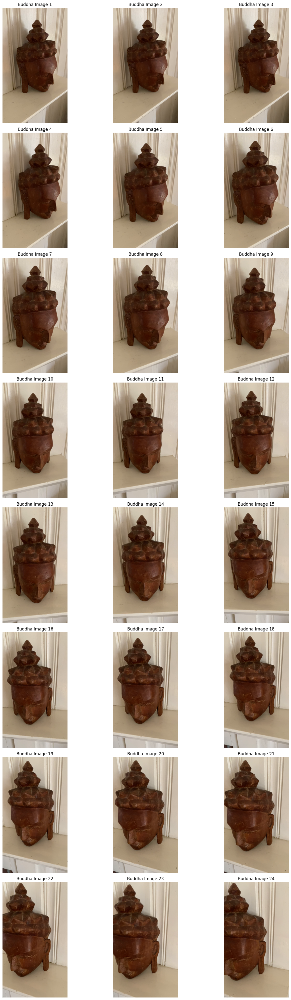

24
1920 1080


In [188]:
# Function to load images from a folder
def load_images_from_folder(folder_path):
    images = []
    filenames = sorted(os.listdir(folder_path))
    for filename in filenames:
        file_path = os.path.join(folder_path, filename)
        image = cv2.imread(file_path)
        if image is not None:
            images.append(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    return images

folder_path = r'/content/drive/MyDrive/AFR/HW4/budha_images'
print("Do images exist in the folder:", os.path.exists(folder_path))
buddha_images = load_images_from_folder(folder_path)

# Define the number of rows and columns for the grid
num_images = len(buddha_images)
num_cols = 3
num_rows = math.ceil(num_images / num_cols)

# Create a figure and axes for the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

axes = axes.flatten()

# Loop through images and plot them in the grid
for i, image in enumerate(buddha_images):
    axes[i].imshow(image)
    axes[i].set_title(f'Buddha Image {i+1}')
    axes[i].axis('off')

# Hide any remaining empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout and display the images
plt.tight_layout()
plt.show()

print(len(buddha_images))
H, W = buddha_images[0].shape[:2]
print(H,W)

In [210]:
class StructureFromMotion:
    def __init__(self):
        pass

    #########################################################################################
    #                       Feature Extraction and Feature Matching
    #########################################################################################

    def intrinsic_matrix(self, H, W):
        f = 1500
        c_x = W / 2
        c_y = H / 2
        intrinsic_matrix = np.array([[f, 0, c_x],
                                     [0, f, c_y],
                                     [0, 0, 1]])
        return intrinsic_matrix

    def apply_clahe(self, image, clip_limit=2.0, tile_grid_size=(8, 8)):
        # Convert the image to grayscale before applying CLAHE
        image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        # Apply CLAHE to the grayscale image
        clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
        image_clahe = clahe.apply(image_gray)
        # Convert back to BGR if needed
        image_clahe_bgr = cv2.cvtColor(image_clahe, cv2.COLOR_GRAY2BGR)
        return image_clahe_bgr

    def custom_non_maximum_suppression(self, detected_points):
        H, W = buddha_images[0].shape[:2]
        output_mask = np.zeros((H, W), dtype=np.uint8)

        pointsR = np.array([pt.response for pt in detected_points])
        sortedI = np.flip(np.argsort(pointsR))

        sortedPts = np.rint([pt.pt for pt in detected_points])[sortedI].astype(int)

        nms = []
        for point, i in zip(sortedPts, sortedI):
            if output_mask[point[1], point[0]] == 0:
                nms.append(i)
                cv2.circle(output_mask, tuple(point), 2, 255, -1)
        return nms

    def detect_keypoints_and_descriptors(self, image):
        sift = cv2.SIFT_create(nfeatures=3500, contrastThreshold=0.04, nOctaveLayers=4)
        if len(image.shape) == 3:
            image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        else:
            image_gray = image
        # Detect keypoints and compute descriptors on the grayscale image
        keypoints, descriptors = sift.detectAndCompute(image_gray, None)
        return keypoints, descriptors

    def find_matches(self, img1, img2):
        global stored_keypoints, stored_descriptors

        # Detect keypoints and descriptors for the first image
        if stored_keypoints is None or stored_descriptors is None:
            keypoints1, descriptors1 = self.detect_keypoints_and_descriptors(img1)
            nms_mask1 = self.custom_non_maximum_suppression(keypoints1)
            keypoints1 = np.array(keypoints1)[nms_mask1]
            descriptors1 = np.array(descriptors1)[nms_mask1]
        else:
            keypoints1 = stored_keypoints
            descriptors1 = stored_descriptors

        # Detect keypoints and descriptors for the second image
        keypoints2, descriptors2 = self.detect_keypoints_and_descriptors(img2)
        nms_mask2 = self.custom_non_maximum_suppression(keypoints2)
        keypoints2 = np.array(keypoints2)[nms_mask2]
        descriptors2 = np.array(descriptors2)[nms_mask2]
        # Store the keypoints and descriptors for img2 globally
        stored_keypoints = keypoints2
        stored_descriptors = descriptors2

        # Create a BFMatcher object with L2 norm
        bf = cv2.BFMatcher(cv2.NORM_L2)

        # Find matches using k-nearest neighbors (k=2)
        matches = bf.knnMatch(descriptors1, descriptors2, k=2)

        # Apply Lowe's ratio test
        good_matches = [m for m, n in matches if m.distance < 0.75 * n.distance]

        # Extract matching points from good matches
        img1_points = np.float32([keypoints1[m.queryIdx].pt for m in good_matches])
        img2_points = np.float32([keypoints2[m.trainIdx].pt for m in good_matches])

        print(f"Number of good matches: {len(good_matches)}")
        print(f"Image1 points shape: {img1_points.shape}")
        print(f"Image2 points shape: {img2_points.shape}")

        # epipolar lines in this itself
        F, mask = cv2.findFundamentalMat(img1_points, img2_points, cv2.FM_RANSAC)
        # Generate and draw epipolar lines for both images
        lines1 = cv2.computeCorrespondEpilines(img2_points.reshape(-1, 1, 2), 2, F).reshape(-1, 3)
        lines2 = cv2.computeCorrespondEpilines(img1_points.reshape(-1, 1, 2), 1, F).reshape(-1, 3)
        img1_with_lines, img2_with_lines = sfm.draw_epipolar_lines(image1, image2, lines1, img1_points, img2_points, lines2)

        # Display images with epipolar lines
        plt.figure(figsize=(12, 6))
        plt.subplot(121)
        plt.imshow(img1_with_lines)
        plt.title(f'Image 0 with Epipolar Lines')
        plt.subplot(122)
        plt.imshow(img2_with_lines)
        plt.title(f'Image 1 with Epipolar Lines')
        plt.show()
        return good_matches, img1_points, img2_points

    ###########################################################################################
    #                  Essential Matrix, Decomposition, and Transformation
    ###########################################################################################

    def essential_matrix(self, q1, q2, K):
        E, mask = cv2.findEssentialMat(q1, q2, K, cv2.RANSAC, 0.999, 1.0)
        q1 = q1[mask.ravel() == 1]
        q2 = q2[mask.ravel() == 1]
        return E, q1, q2, mask

    def calculate_transformation_matrix(self, R, t):
        transformation_matrix = np.eye(4, dtype=np.float64)
        # Set the rotation part
        transformation_matrix[:3, :3] = R
        # Set the translation part, ensuring t is a 1D array
        transformation_matrix[:3, 3] = t.ravel()
        return transformation_matrix

    def get_projection_matrix(self, T):
        return K @ np.linalg.inv(T)[:3, :]

    ############################################################################################
    #                           Camera Projection and Triangulation
    ############################################################################################

    def get_triangulation_matrix(self, Proj_matrix1, Proj_matrix2, q1, q2):
        points_4d = cv2.triangulatePoints(Proj_matrix1, Proj_matrix2, q1.T, q2.T)
        points_3d = points_4d[:3, :] / points_4d[3, :]
        valid_mask = points_3d[2, :] > 0
        points_3d = points_3d[:, valid_mask]
        q1, q2 = q1[valid_mask], q2[valid_mask]
        return points_3d.T, q1, q2

    ##########################################################################################
    #                                 Draw Epipolar Lines
    ##########################################################################################

    def draw_epipolar_lines(self, img1, img2, lines1, points1, points2, lines2):
        # Copy images to avoid modifying originals
        img1 = img1.copy()
        img2 = img2.copy()
        # Ensure points1 and points2 are numpy arrays
        points1 = np.array(points1, dtype=np.float32).reshape(-1, 2)
        points2 = np.array(points2, dtype=np.float32).reshape(-1, 2)
        # Debug: Print shapes
        print(f"points1 shape: {points1.shape}, points2 shape: {points2.shape}")
        print(f"lines1 shape: {lines1.shape}, lines2 shape: {lines2.shape}")
        # Ensure lines1 and lines2 have valid dimensions
        lines1 = np.array(lines1, dtype=np.float32)
        lines2 = np.array(lines2, dtype=np.float32)
        # Draw the epipolar lines on the first image
        for r, pt1 in zip(lines1, points1):
            color = tuple(np.random.randint(0, 255, 3).tolist())
            x0, y0 = map(int, [0, -r[2] / r[1]])
            x1, y1 = map(int, [img1.shape[1], -(r[2] + r[0] * img1.shape[1]) / r[1]])
            img1 = cv2.line(img1, (x0, y0), (x1, y1), color, 1)
            # Correctly extract integer x, y coordinates for the point
            pt1 = tuple(map(int, pt1.ravel()))
            img1 = cv2.circle(img1, pt1, 5, color, -1)

        # Draw the epipolar lines on the second image
        for r, pt2 in zip(lines2, points2):
            color = tuple(np.random.randint(0, 255, 3).tolist())
            x0, y0 = map(int, [0, -r[2] / r[1]])
            x1, y1 = map(int, [img2.shape[1], -(r[2] + r[0] * img2.shape[1]) / r[1]])
            img2 = cv2.line(img2, (x0, y0), (x1, y1), color, 1)
            # Correctly extract integer x, y coordinates for the point
            pt2 = tuple(map(int, pt2.ravel()))
            img2 = cv2.circle(img2, pt2, 5, color, -1)

        return img1, img2



In [211]:
class Point3D:
    def __init__(self, coords, origin):
        self.coords = np.array(coords, dtype=np.float32)
        self.origin = origin

def update_cloud(cloud, index, points_3D, q1, q2):

    def find_point_in_cloud(cloud, origin_key, origin_value):

        for point in cloud:
            if np.array_equal(point.origin.get(origin_key), origin_value):
                return point
        return None

    for i, point_3d in enumerate(points_3D):
        # Create a new Point3D object
        new_point = Point3D(
            coords=point_3d,
            origin={index: q1[i], index + 1: q2[i]}
        )

        # Attempt to find an existing point in the cloud
        existing_point = find_point_in_cloud(cloud, index, q1[i])

        if existing_point:
            # Update the origin information for the next frame
            existing_point.origin[index + 1] = q2[i]
        else:
            # Add the new point to the cloud
            cloud.append(new_point)


def find_2d_3d_correspondences(image_index, keypoints, pointcloud, q1, tolerance=1e-2):
    matched_3d = []
    matched_2d = []
    matched_indices = []

    # Extract 2D projections for the current image from the point cloud
    projections = []
    coords = []
    for point in pointcloud:
        if image_index in point.origin:
            projections.append(point.origin[image_index])
            coords.append(point.coords)

    if len(projections) == 0:
        print(f"No projections found in pointcloud for image {image_index}.")
        return np.array([]), np.array([]), []

    projections = np.array(projections)
    coords = np.array(coords)

    # Build KD-Tree for projections
    kd_tree = cKDTree(projections)

    # Match each 2D keypoint to the closest 2D projection within the tolerance
    for i, keypoint in enumerate(q1):
        dist, idx = kd_tree.query(keypoint, distance_upper_bound=tolerance)
        if dist < tolerance:
            matched_2d.append(keypoint)
            matched_3d.append(coords[idx])
            matched_indices.append(i)

    # Convert to NumPy arrays
    matched_3d = np.array(matched_3d, dtype=np.float32)
    matched_2d = np.array(matched_2d, dtype=np.float32)

    return matched_2d, matched_3d, matched_indices


Processing image pair 0 and 1
Number of good matches: 548
Image1 points shape: (548, 2)
Image2 points shape: (548, 2)
points1 shape: (548, 2), points2 shape: (548, 2)
lines1 shape: (548, 3), lines2 shape: (548, 3)


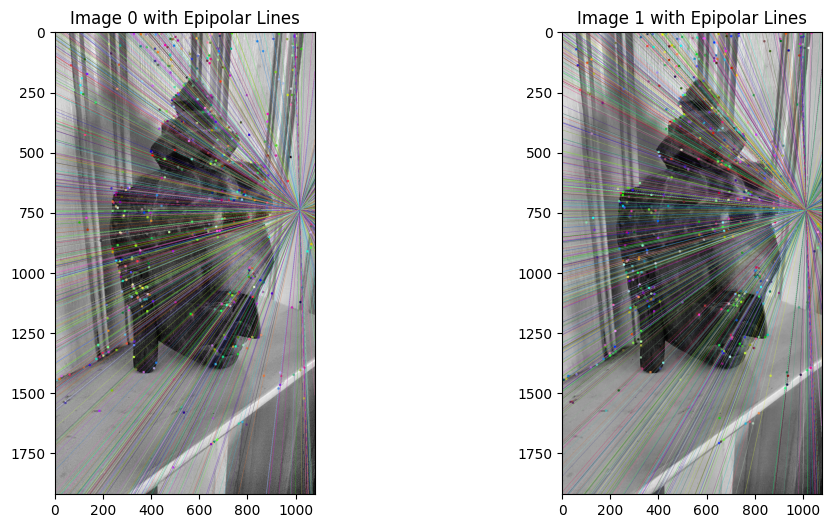

In [212]:
sfm = StructureFromMotion()
K = sfm.intrinsic_matrix(H, W)
camera_poses = []
stored_keypoints = None
stored_descriptors = None
print(f"\nProcessing image pair 0 and 1")
image1, image2 = buddha_images[0], buddha_images[1]
image1, image2 = sfm.apply_clahe(buddha_images[0]), sfm.apply_clahe(buddha_images[1])
camera_poses = [None, None]

_, keypts1, keypts2 = sfm.find_matches(image1, image2)
E, keypt1, keypt2, mask = sfm.essential_matrix(keypts1, keypts2, K)
_, R, t, _ = cv2.recoverPose(E, keypt1, keypt2, K)
Transformation_matrix = sfm.calculate_transformation_matrix(R, t)

camera_poses[0] = np.eye(4)
camera_poses[1] = np.linalg.inv(Transformation_matrix)

Projection_matrix_1 = sfm.get_projection_matrix(camera_poses[0])
Projection_matrix_2 = sfm.get_projection_matrix(camera_poses[1])

points_3D, point1, point2 = sfm.get_triangulation_matrix(Projection_matrix_1, Projection_matrix_2, keypt1, keypt2)

pointcloud = [Point3D(point, {0: point1[i], 0 + 1: point2[i]}) for i, point in enumerate(points_3D)]

F, mask = cv2.findFundamentalMat(keypts1, keypts2, cv2.FM_RANSAC)

source_keypoints = keypt2

In [213]:
print(f"length of camera_poses: {len(camera_poses)}")

length of camera_poses: 2



Processing image pair 1 and 2
Number of good matches: 391
Image1 points shape: (391, 2)
Image2 points shape: (391, 2)
points1 shape: (391, 2), points2 shape: (391, 2)
lines1 shape: (391, 3), lines2 shape: (391, 3)


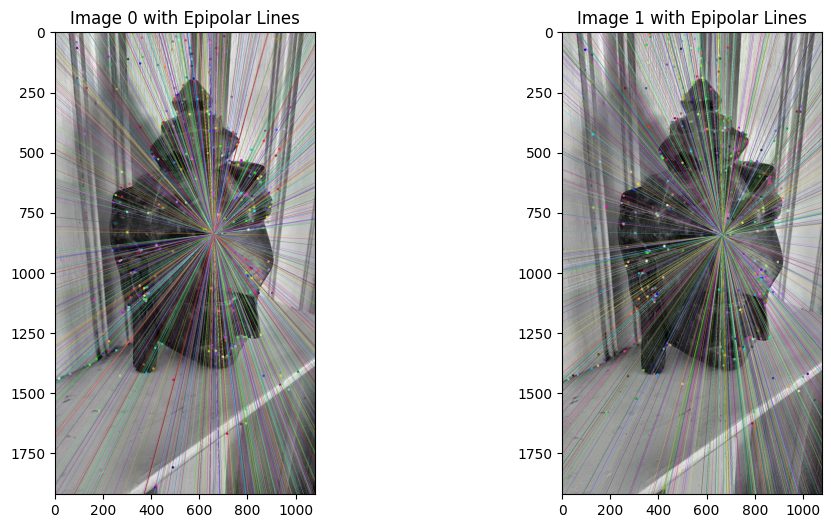

matched_3d shape: (59, 3), dtype: float32
matched_2d_image2 shape: (59, 2), dtype: float32
Number of 3D-2D matches: 59
Length of camera_poses: 3

Processing image pair 2 and 3
Number of good matches: 371
Image1 points shape: (371, 2)
Image2 points shape: (371, 2)
points1 shape: (371, 2), points2 shape: (371, 2)
lines1 shape: (371, 3), lines2 shape: (371, 3)


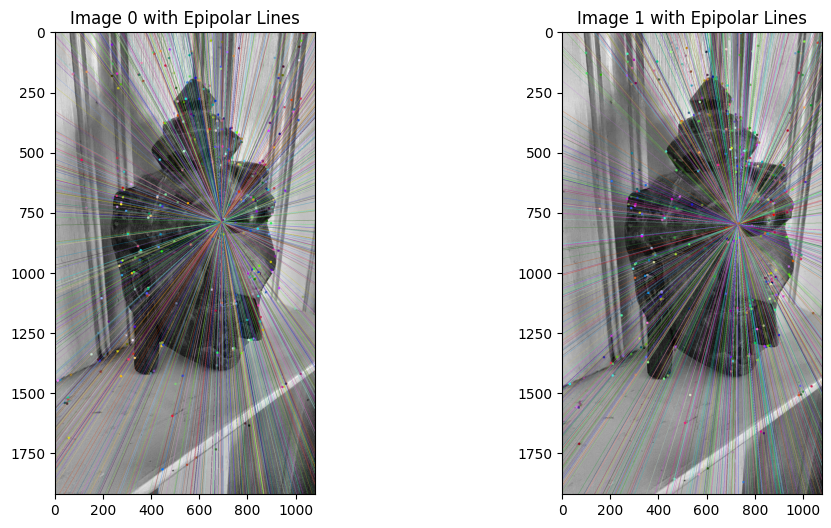

matched_3d shape: (90, 3), dtype: float32
matched_2d_image2 shape: (90, 2), dtype: float32
Number of 3D-2D matches: 90
Length of camera_poses: 4

Processing image pair 3 and 4
Number of good matches: 191
Image1 points shape: (191, 2)
Image2 points shape: (191, 2)
points1 shape: (191, 2), points2 shape: (191, 2)
lines1 shape: (191, 3), lines2 shape: (191, 3)


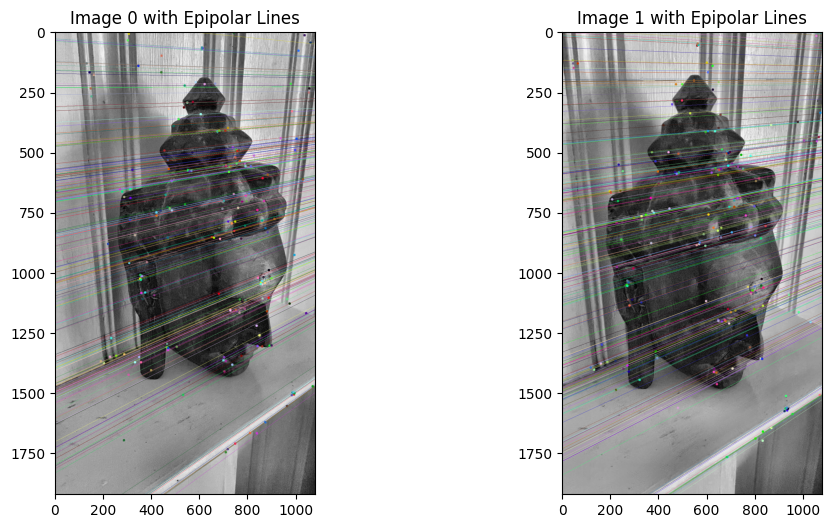

matched_3d shape: (42, 3), dtype: float32
matched_2d_image2 shape: (42, 2), dtype: float32
Number of 3D-2D matches: 42
Length of camera_poses: 5

Processing image pair 4 and 5
Number of good matches: 229
Image1 points shape: (229, 2)
Image2 points shape: (229, 2)
points1 shape: (229, 2), points2 shape: (229, 2)
lines1 shape: (229, 3), lines2 shape: (229, 3)


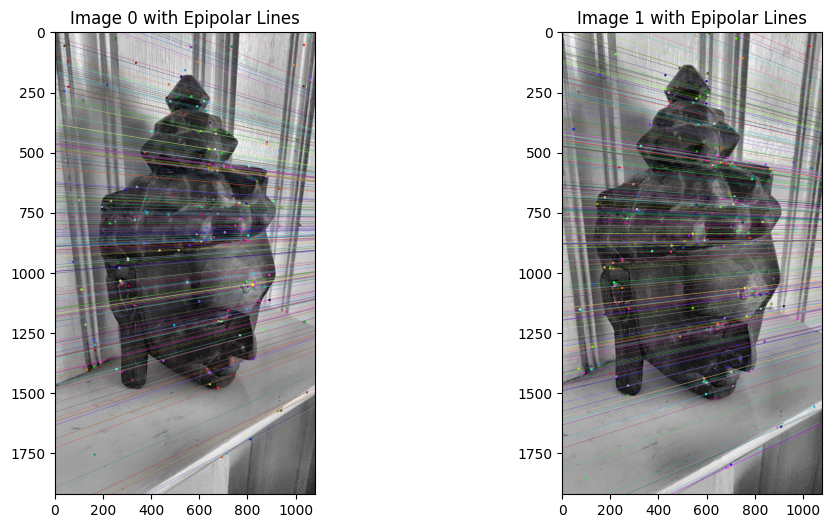

matched_3d shape: (33, 3), dtype: float32
matched_2d_image2 shape: (33, 2), dtype: float32
Number of 3D-2D matches: 33
Length of camera_poses: 6

Processing image pair 5 and 6
Number of good matches: 262
Image1 points shape: (262, 2)
Image2 points shape: (262, 2)
points1 shape: (262, 2), points2 shape: (262, 2)
lines1 shape: (262, 3), lines2 shape: (262, 3)


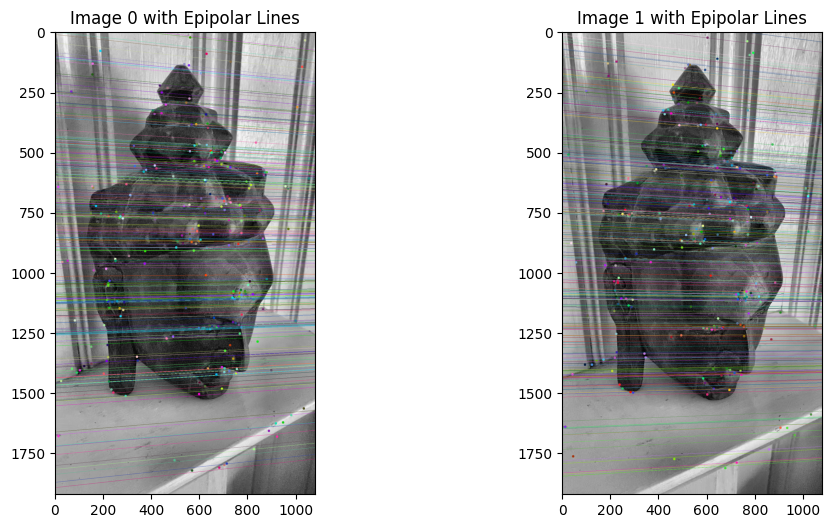

matched_3d shape: (38, 3), dtype: float32
matched_2d_image2 shape: (38, 2), dtype: float32
Number of 3D-2D matches: 38
Length of camera_poses: 7

Processing image pair 6 and 7
Number of good matches: 272
Image1 points shape: (272, 2)
Image2 points shape: (272, 2)
points1 shape: (272, 2), points2 shape: (272, 2)
lines1 shape: (272, 3), lines2 shape: (272, 3)


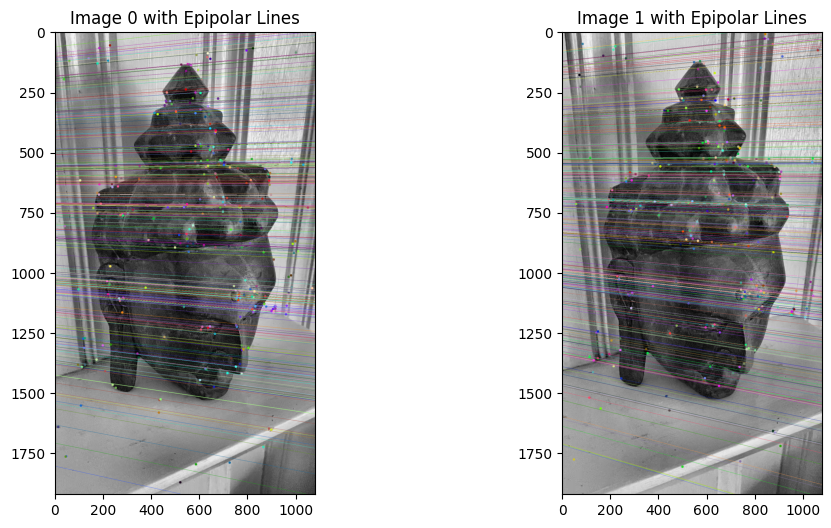

matched_3d shape: (36, 3), dtype: float32
matched_2d_image2 shape: (36, 2), dtype: float32
Number of 3D-2D matches: 36
Length of camera_poses: 8

Processing image pair 7 and 8
Number of good matches: 217
Image1 points shape: (217, 2)
Image2 points shape: (217, 2)
points1 shape: (217, 2), points2 shape: (217, 2)
lines1 shape: (217, 3), lines2 shape: (217, 3)


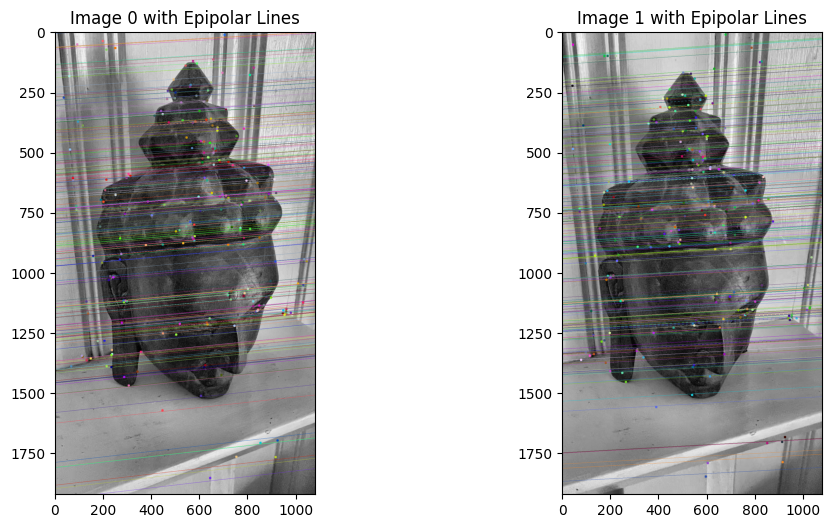

matched_3d shape: (25, 3), dtype: float32
matched_2d_image2 shape: (25, 2), dtype: float32
Number of 3D-2D matches: 25
Length of camera_poses: 9

Processing image pair 8 and 9
Number of good matches: 263
Image1 points shape: (263, 2)
Image2 points shape: (263, 2)
points1 shape: (263, 2), points2 shape: (263, 2)
lines1 shape: (263, 3), lines2 shape: (263, 3)


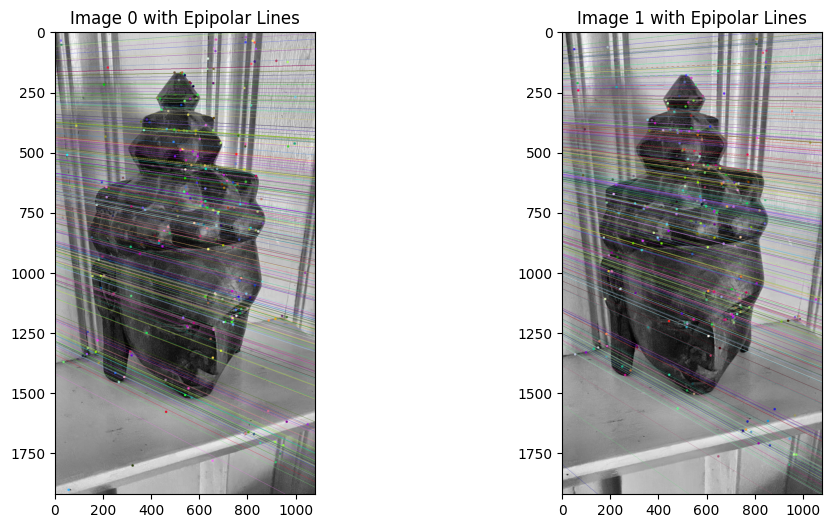

matched_3d shape: (28, 3), dtype: float32
matched_2d_image2 shape: (28, 2), dtype: float32
Number of 3D-2D matches: 28
Length of camera_poses: 10

Processing image pair 9 and 10
Number of good matches: 248
Image1 points shape: (248, 2)
Image2 points shape: (248, 2)
points1 shape: (248, 2), points2 shape: (248, 2)
lines1 shape: (248, 3), lines2 shape: (248, 3)


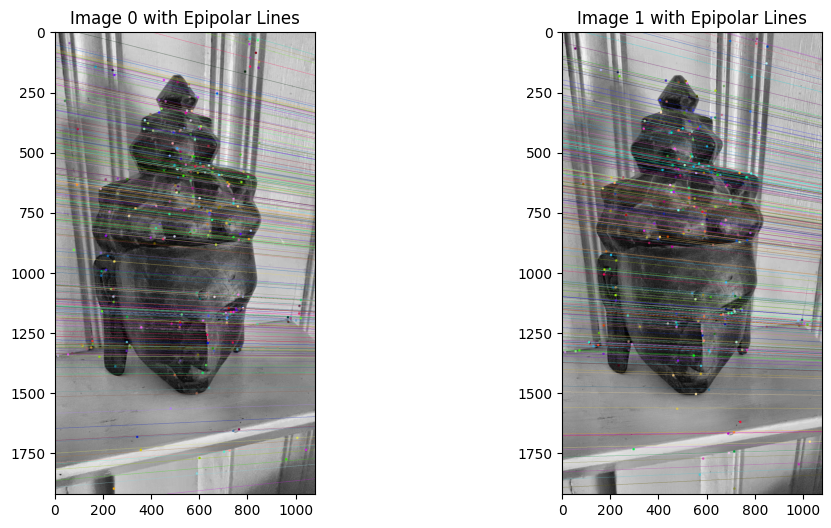

matched_3d shape: (38, 3), dtype: float32
matched_2d_image2 shape: (38, 2), dtype: float32
Number of 3D-2D matches: 38
Length of camera_poses: 11

Processing image pair 10 and 11
Number of good matches: 260
Image1 points shape: (260, 2)
Image2 points shape: (260, 2)
points1 shape: (260, 2), points2 shape: (260, 2)
lines1 shape: (260, 3), lines2 shape: (260, 3)


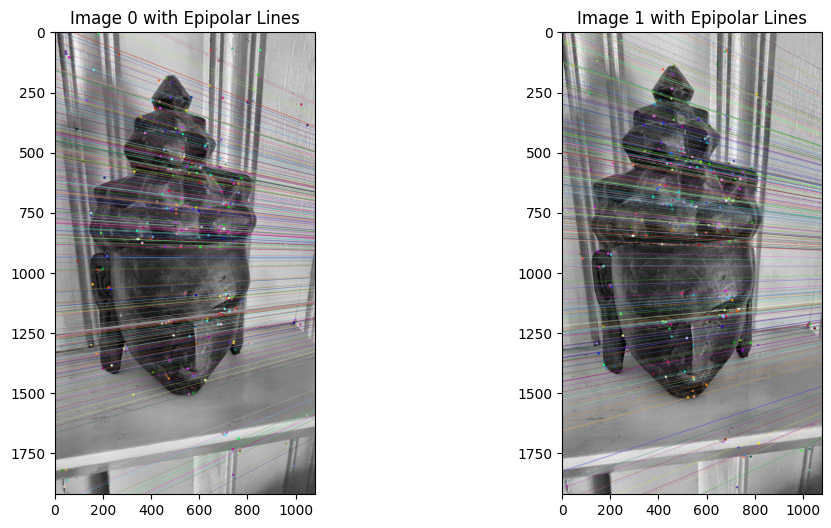

matched_3d shape: (39, 3), dtype: float32
matched_2d_image2 shape: (39, 2), dtype: float32
Number of 3D-2D matches: 39
Length of camera_poses: 12

Processing image pair 11 and 12
Number of good matches: 299
Image1 points shape: (299, 2)
Image2 points shape: (299, 2)
points1 shape: (299, 2), points2 shape: (299, 2)
lines1 shape: (299, 3), lines2 shape: (299, 3)


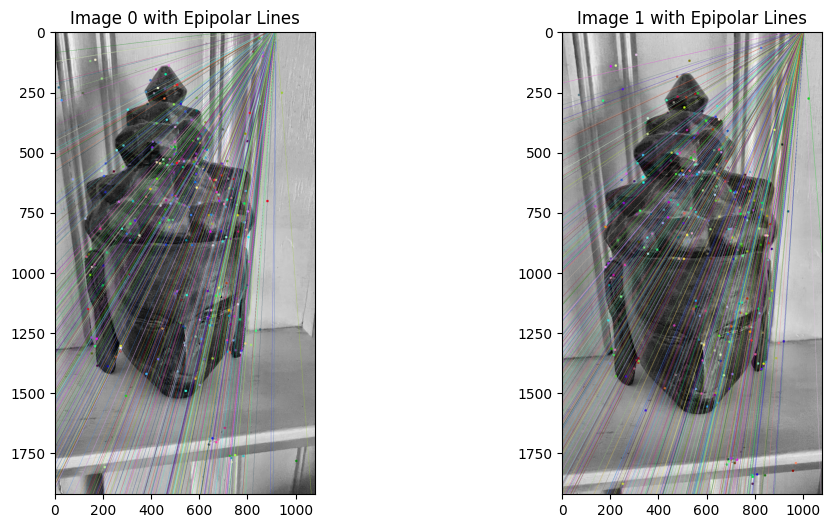

matched_3d shape: (59, 3), dtype: float32
matched_2d_image2 shape: (59, 2), dtype: float32
Number of 3D-2D matches: 59
Length of camera_poses: 13

Processing image pair 12 and 13
Number of good matches: 236
Image1 points shape: (236, 2)
Image2 points shape: (236, 2)
points1 shape: (236, 2), points2 shape: (236, 2)
lines1 shape: (236, 3), lines2 shape: (236, 3)


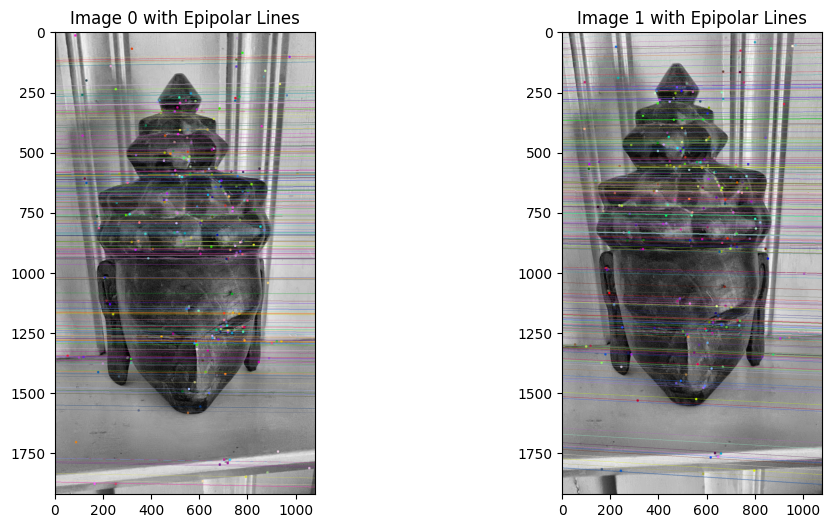

matched_3d shape: (47, 3), dtype: float32
matched_2d_image2 shape: (47, 2), dtype: float32
Number of 3D-2D matches: 47
Length of camera_poses: 14

Processing image pair 13 and 14
Number of good matches: 186
Image1 points shape: (186, 2)
Image2 points shape: (186, 2)
points1 shape: (186, 2), points2 shape: (186, 2)
lines1 shape: (186, 3), lines2 shape: (186, 3)


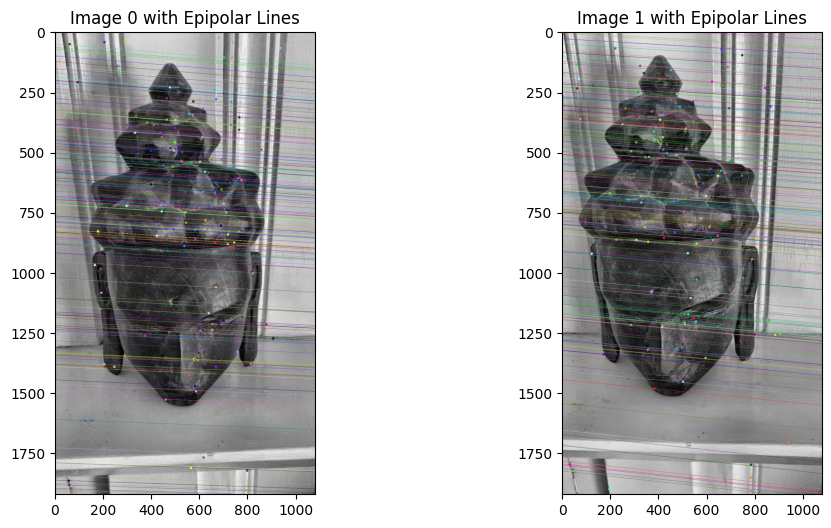

matched_3d shape: (26, 3), dtype: float32
matched_2d_image2 shape: (26, 2), dtype: float32
Number of 3D-2D matches: 26
Length of camera_poses: 15

Processing image pair 14 and 15
Number of good matches: 265
Image1 points shape: (265, 2)
Image2 points shape: (265, 2)
points1 shape: (265, 2), points2 shape: (265, 2)
lines1 shape: (265, 3), lines2 shape: (265, 3)


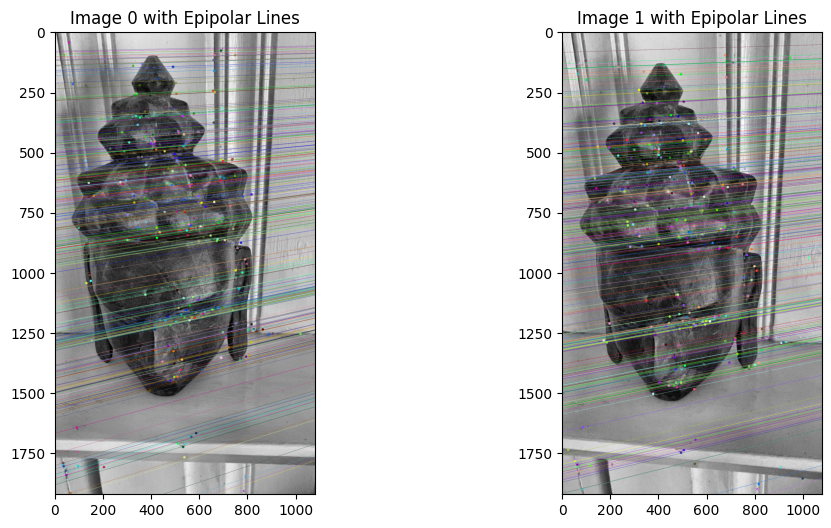

matched_3d shape: (22, 3), dtype: float32
matched_2d_image2 shape: (22, 2), dtype: float32
Number of 3D-2D matches: 22
Length of camera_poses: 16

Processing image pair 15 and 16
Number of good matches: 282
Image1 points shape: (282, 2)
Image2 points shape: (282, 2)
points1 shape: (282, 2), points2 shape: (282, 2)
lines1 shape: (282, 3), lines2 shape: (282, 3)


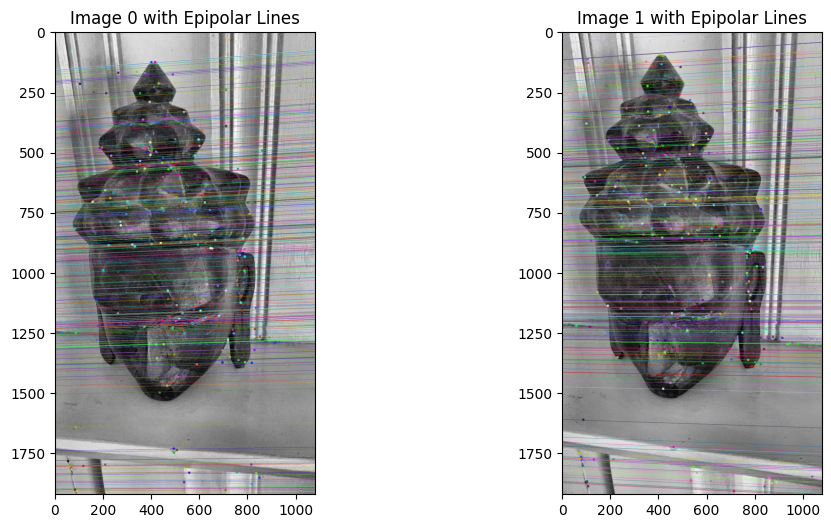

matched_3d shape: (40, 3), dtype: float32
matched_2d_image2 shape: (40, 2), dtype: float32
Number of 3D-2D matches: 40
Length of camera_poses: 17

Processing image pair 16 and 17
Number of good matches: 360
Image1 points shape: (360, 2)
Image2 points shape: (360, 2)
points1 shape: (360, 2), points2 shape: (360, 2)
lines1 shape: (360, 3), lines2 shape: (360, 3)


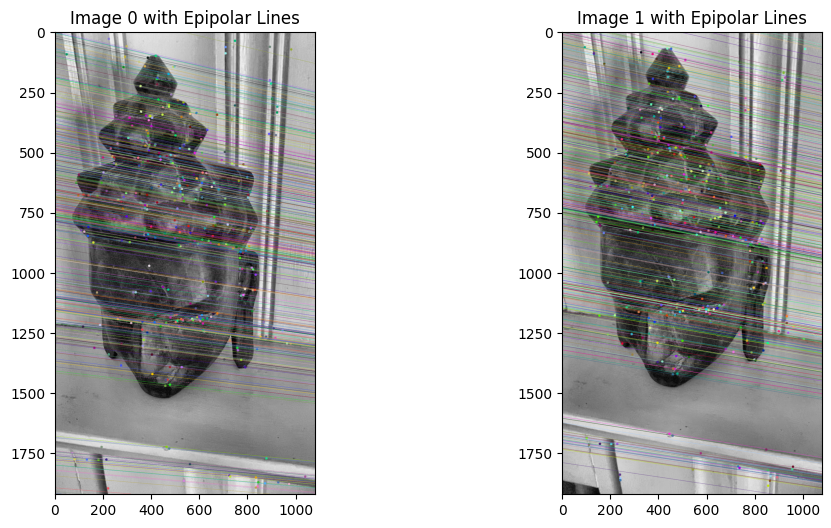

matched_3d shape: (55, 3), dtype: float32
matched_2d_image2 shape: (55, 2), dtype: float32
Number of 3D-2D matches: 55
Length of camera_poses: 18

Processing image pair 17 and 18
Number of good matches: 385
Image1 points shape: (385, 2)
Image2 points shape: (385, 2)
points1 shape: (385, 2), points2 shape: (385, 2)
lines1 shape: (385, 3), lines2 shape: (385, 3)


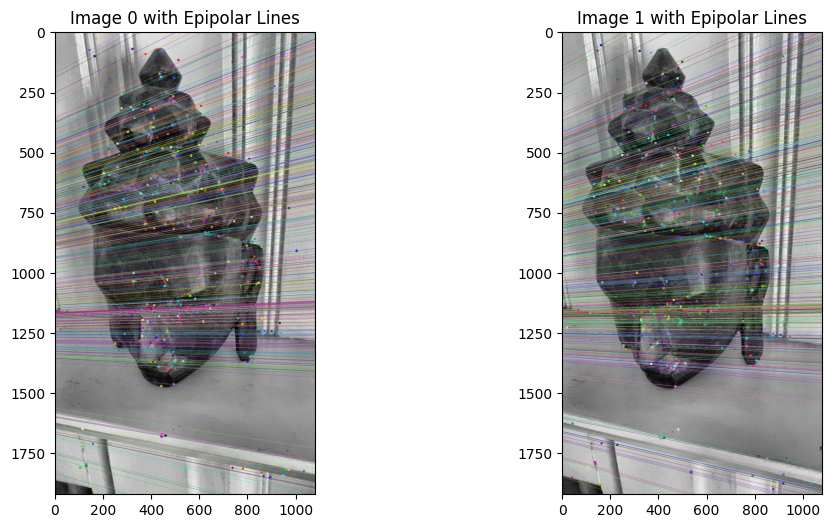

matched_3d shape: (76, 3), dtype: float32
matched_2d_image2 shape: (76, 2), dtype: float32
Number of 3D-2D matches: 76
Length of camera_poses: 19

Processing image pair 18 and 19
Number of good matches: 277
Image1 points shape: (277, 2)
Image2 points shape: (277, 2)
points1 shape: (277, 2), points2 shape: (277, 2)
lines1 shape: (277, 3), lines2 shape: (277, 3)


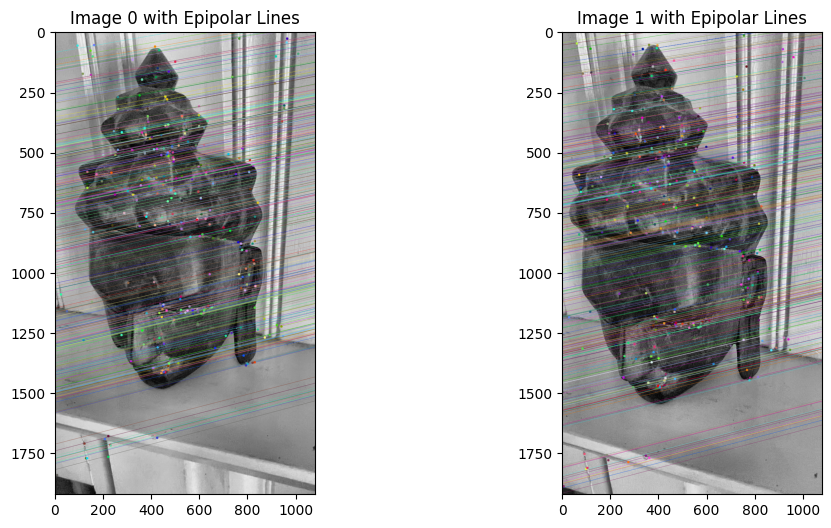

matched_3d shape: (59, 3), dtype: float32
matched_2d_image2 shape: (59, 2), dtype: float32
Number of 3D-2D matches: 59
Length of camera_poses: 20

Processing image pair 19 and 20
Number of good matches: 337
Image1 points shape: (337, 2)
Image2 points shape: (337, 2)
points1 shape: (337, 2), points2 shape: (337, 2)
lines1 shape: (337, 3), lines2 shape: (337, 3)


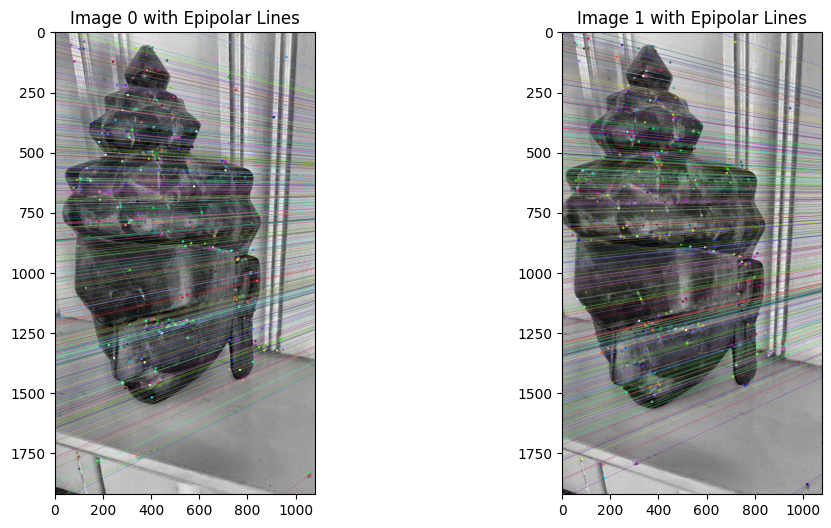

matched_3d shape: (65, 3), dtype: float32
matched_2d_image2 shape: (65, 2), dtype: float32
Number of 3D-2D matches: 65
Length of camera_poses: 21

Processing image pair 20 and 21
Number of good matches: 392
Image1 points shape: (392, 2)
Image2 points shape: (392, 2)
points1 shape: (392, 2), points2 shape: (392, 2)
lines1 shape: (392, 3), lines2 shape: (392, 3)


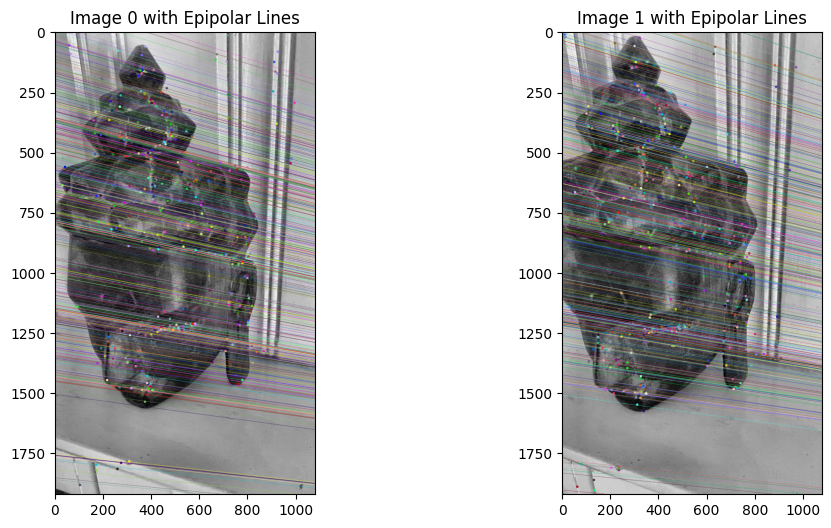

matched_3d shape: (81, 3), dtype: float32
matched_2d_image2 shape: (81, 2), dtype: float32
Number of 3D-2D matches: 81
Length of camera_poses: 22

Processing image pair 21 and 22
Number of good matches: 313
Image1 points shape: (313, 2)
Image2 points shape: (313, 2)
points1 shape: (313, 2), points2 shape: (313, 2)
lines1 shape: (313, 3), lines2 shape: (313, 3)


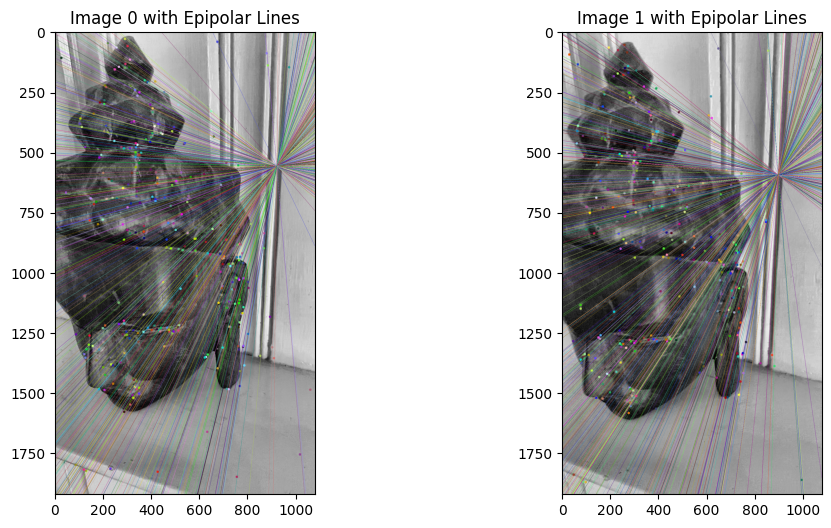

matched_3d shape: (52, 3), dtype: float32
matched_2d_image2 shape: (52, 2), dtype: float32
Number of 3D-2D matches: 52
Length of camera_poses: 23


In [214]:
for i in range(1, len(buddha_images) - 2):
    print(f"\nProcessing image pair {i} and {i + 1}")
    image1, image2 = buddha_images[i], buddha_images[i + 1]
    image1, image2 = sfm.apply_clahe(buddha_images[i]), sfm.apply_clahe(buddha_images[i + 1])
    _, keypts1, keypts2 = sfm.find_matches(image1, image2)
    # Ensure q1 and q2 are of dtype np.float32
    keypts1 = np.array(keypts1, dtype=np.float32)
    keypts2 = np.array(keypts2, dtype=np.float32)
    # Step 1: Compute Essential Matrix and Filter Matches
    E, keypt1, keypt2, mask = sfm.essential_matrix(keypts1, keypts2, K)
    # Step 2: Find 3D-2D Correspondences
    matched_2d_image1, matched_3d, matched_indices = find_2d_3d_correspondences(
        i, source_keypoints, pointcloud, keypt1, tolerance=2.0  # Increased tolerance
    )
    # matched_2d_image1, matched_3d, matched_indices = CreatePointCloud(i, source_keypoints, pointcloud, keypt1, 1e-2)
    matched_3d = np.array(matched_3d)
    matched_3d = matched_3d.astype(np.float32)

    matched_2d_image2 = keypt2[matched_indices]
    matched_2d_image2 = np.array(matched_2d_image2, dtype=np.float32)

    print(f"matched_3d shape: {matched_3d.shape}, dtype: {matched_3d.dtype}")
    print(f"matched_2d_image2 shape: {matched_2d_image2.shape}, dtype: {matched_2d_image2.dtype}")
    print(f"Number of 3D-2D matches: {len(matched_3d)}")

    ran, rvec, t, inliers = cv2.solvePnPRansac( matched_3d, matched_2d_image2, K, None)

    if ran:
        R, _ = cv2.Rodrigues(rvec)
    tempTransformation = sfm.calculate_transformation_matrix(R, t)
    camera_poses.append(np.linalg.inv(tempTransformation))

    print(f"Length of camera_poses: {len(camera_poses)}")

    Projection_matrix_1 = sfm.get_projection_matrix(camera_poses[i])
    Projection_matrix_2 = sfm.get_projection_matrix(camera_poses[i + 1])
    points_3D, point1, point2 = sfm.get_triangulation_matrix(Projection_matrix_1, Projection_matrix_2, keypt1, keypt2)
    update_cloud(pointcloud, i, points_3D, point1, point2)

    source_keypoints = keypt2

In [215]:
print(f"Total number of pointcloud: {len(pointcloud)}")
print(f"Total number of camera_poses: {len(camera_poses)}")
print(f"Total number of 3D points: {len(points_3D)}")

Total number of pointcloud: 2654
Total number of camera_poses: 23
Total number of 3D points: 164


In [216]:
print(camera_poses)
print(pointcloud)
pointcloud_old = copy.deepcopy(pointcloud)

[array([[1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 0., 1.]]), array([[ 9.99999464e-01,  8.17653783e-04,  6.35411531e-04,
         9.43193656e-02],
       [-8.17482817e-04,  9.99999630e-01, -2.69276530e-04,
        -2.51868547e-01],
       [-6.35631471e-04,  2.68756948e-04,  9.99999762e-01,
         9.63154241e-01],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         1.00000000e+00]]), array([[ 9.99983489e-01,  4.06603675e-03, -4.06057550e-03,
         2.89102953e-01],
       [-4.06754151e-03,  9.99991662e-01, -3.62388459e-04,
        -7.45985845e-01],
       [ 4.05906816e-03,  3.78899035e-04,  9.99991690e-01,
         2.59895464e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         1.00000000e+00]]), array([[ 9.99523425e-01,  1.23522484e-02, -2.82903516e-02,
         7.75967056e-01],
       [-1.24324204e-02,  9.99919177e-01, -2.65975320e-03,
        -2.02588957e+00],
       [ 2.82552111e-02,  3.01020317e-03,  

In [217]:
def display_interactive_point_cloud_with_camera_frames(points_3d, poses, title, intrinsic_matrix, scale=1):
    """
    Interactive visualization of 3D point cloud with camera frames using Plotly.

    Parameters:
        points_3d (list of np.array): List of 3D points in the cloud.
        colors (list of np.array): RGB colors for each 3D point.
        poses (list of np.array): List of 4x4 transformation matrices representing camera poses.
        intrinsic_matrix (np.array): Camera intrinsic matrix.
        scale (float): Scaling factor for camera frustum visualization.
    """
    if len(points_3d) == 0:
        print("No points to display.")
        return

    # Convert points and colors to numpy arrays
    points = np.array(points_3d)
    # colors = np.array(colors) / 255.0  # Normalize colors to [0, 1] range

    # Filter outliers (optional)
    distances = np.linalg.norm(points - points.mean(axis=0), axis=1)
    threshold = np.percentile(distances, 95)  # Keep 95% closest points
    filtered_points = points[distances < threshold]
    # filtered_colors = colors[distances < threshold]

    # Extract X, Y, Z coordinates
    x = filtered_points[:, 0]
    y = filtered_points[:, 1]
    z = filtered_points[:, 2]

    # Create a scatter plot for the 3D points
    scatter_points = go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='markers',
        marker=dict(
            size=1.0,
            color='brown',  # Use the stored RGB colors
            opacity=0.8
        ),
        name="3D Points"
    )

    # Create camera frustums
    camera_lines = []
    for i, pose in enumerate(poses):
        position = pose[:3, 3]  # Extract the translation (camera position)
        rotation = pose[:3, :3]  # Extract the rotation matrix

        # Create the camera frustum
        camera_corners = np.array([
            [-5, -5, 5],
            [5, -5, 5],
            [5, 5, 5],
            [-5, 5, 5],
            [0, 0, 0]  # Camera center
        ], dtype=float)

        # Scale the frustum based on the camera's intrinsic matrix
        focal_length = intrinsic_matrix[0, 0]
        image_size = intrinsic_matrix[:2, 2] * 2
        camera_corners[:, 0] *= image_size[0] / focal_length * scale
        camera_corners[:, 1] *= image_size[1] / focal_length * scale
        camera_corners[:, 2] *= scale

        # Transform the frustum to world coordinates
        camera_corners = (rotation @ camera_corners.T).T + position

        # Add lines connecting the camera center to the corners
        for j in range(4):
            camera_lines.append(go.Scatter3d(
                x=[position[0], camera_corners[j, 0]],
                y=[position[1], camera_corners[j, 1]],
                z=[position[2], camera_corners[j, 2]],
                mode='lines',
                line=dict(color='red', width=2),
                name=f"Camera {i}"
            ))

        # Add lines between the corners to form the frustum edges
        for j in range(4):
            camera_lines.append(go.Scatter3d(
                x=[camera_corners[j, 0], camera_corners[(j + 1) % 4, 0]],
                y=[camera_corners[j, 1], camera_corners[(j + 1) % 4, 1]],
                z=[camera_corners[j, 2], camera_corners[(j + 1) % 4, 2]],
                mode='lines',
                line=dict(color='blue', width=1),
                name=f"Camera {i}"
            ))

    # Combine all plots
    fig = go.Figure(data=[scatter_points] + camera_lines)

    # Update layout for better visualization
    fig.update_layout(
        scene=dict(
            xaxis_title="X",
            yaxis_title="Y",
            zaxis_title="Z",
            aspectmode='data'  # Ensures equal scaling of axes
        ),
        title=dict(text=f"{title}: 3D Point Cloud with Camera Frames", x=0.5)
    )

    # Show the interactive plot
    fig.show()

In [218]:
height, width = buddha_images[0].shape[:2]
focal_length = 1600
K = np.array([
    [focal_length, 0, width / 2],
    [0, focal_length, height / 2],
    [0, 0, 1]
], dtype=np.float32)
display_interactive_point_cloud_with_camera_frames(np.array([point.coords for point in pointcloud_old]), camera_poses,"Initial", K)

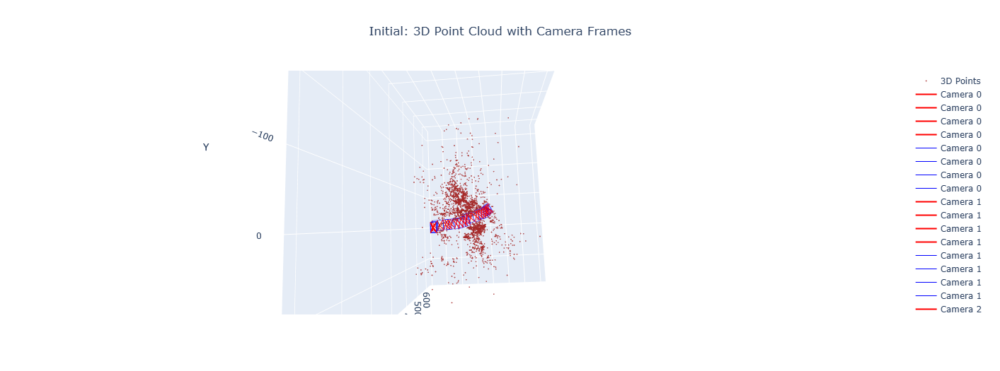

In [219]:
# Define camera intrinsic parameters
height, width = buddha_images[0].shape[:2]
focal_length = 1600
K_matrix = np.array([
    [focal_length, 0, width / 2],
    [0, focal_length, height / 2],
    [0, 0, 1]
], dtype=np.float32)

# Convert K_matrix to gtsam.Cal3_S2 format
K = gtsam.Cal3_S2(
    fx=K_matrix[0, 0], fy=K_matrix[1, 1], s=0.0,
    u0=K_matrix[0, 2], v0=K_matrix[1, 2]
)

# Define noise models
measurement_noise = gtsam.noiseModel.Isotropic.Sigma(2, 10.0)
pose_noise = gtsam.noiseModel.Diagonal.Sigmas(np.array([0.3, 0.3, 0.3, 0.1, 0.1, 0.1]))
point_noise = gtsam.noiseModel.Isotropic.Sigma(3, 1)

# Initialize factor graph
graph = gtsam.NonlinearFactorGraph()

# Add prior factor for the first pose
graph.push_back(gtsam.PriorFactorPose3(X(0), gtsam.Pose3(camera_poses[0]), pose_noise))

# Add projection factors for all points in the point cloud
for point_index, point in enumerate(pointcloud):
    for pose_index, measurement in point.origin.items():
        graph.push_back(
            gtsam.GenericProjectionFactorCal3_S2(
                measurement, measurement_noise,
                X(int(pose_index)), L(point_index), K
            )
        )

# Add prior factor for the first 3D point
graph.push_back(gtsam.PriorFactorPoint3(
    L(0), gtsam.Point3(pointcloud[0].coords), point_noise
))

# Initialize estimates for poses
initial_estimate = gtsam.Values()
for i in range(len(buddha_images) - 2):
    initial_estimate.insert(X(i), gtsam.Pose3(camera_poses[i]))
initial_estimate.insert(X(22), gtsam.Pose3(camera_poses[21]))

# Initialize estimates for 3D points
for point_index, point in enumerate(pointcloud):
    initial_estimate.insert(L(point_index), gtsam.Point3(point.coords))

# Set up and run the optimizer
params = gtsam.LevenbergMarquardtParams()
params.setVerbosityLM("SUMMARY")
optimizer = gtsam.LevenbergMarquardtOptimizer(graph, initial_estimate, params)
result = optimizer.optimize()


In [220]:
for i in range(len(buddha_images)-2):
    camera_poses[i] = result.atPose3(X(i)).matrix()
for j, point in enumerate(pointcloud):
    pointcloud[j].coords = result.atPoint3(L(j))

In [221]:
height, width = buddha_images[0].shape[:2]
focal_length = 1600
K = np.array([
    [focal_length, 0, width / 2],
    [0, focal_length, height / 2],
    [0, 0, 1]
], dtype=np.float32)
display_interactive_point_cloud_with_camera_frames(np.array([point.coords for point in pointcloud]), camera_poses,"Optimized", K)

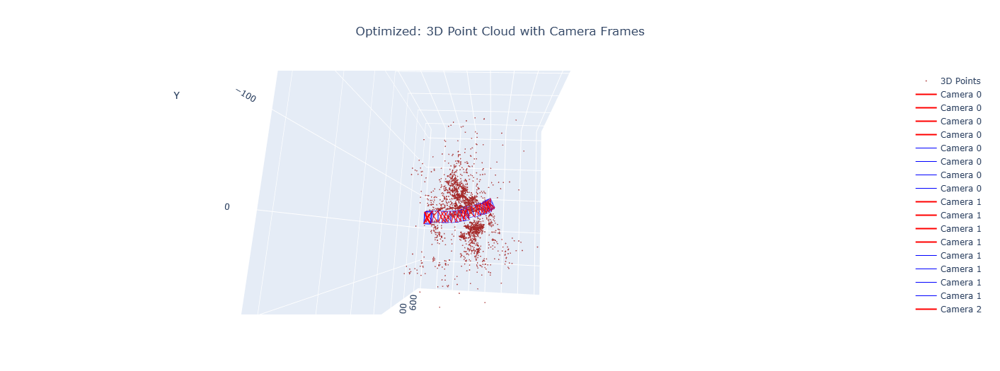